In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import heapq 
import pickle
%matplotlib inline
import matplotlib.pyplot as plt
import dateutil
import datetime 
from time import time
import re
from scipy import interpolate
import timeit
from dateutil.rrule import DAILY, rrule, MO, TU, WE, TH, FR
import seaborn as sns
from sklearn.mixture import GaussianMixture
import itertools
from scipy import linalg

import sys
sys.path.append("../")

from historical.readData.estimateData3 import read

from historical.readData.estimateData3 import read
from historical.readData.estimateData3 import search_travels
from historical.readData.estimateData3 import estimate
from historical.readData.estimateData3 import stops_distance

from historical.readData.travels3 import haversine2

def calcula_dist_shape(selec_linhas):
    distance_all_shapes = {}
    # print 'Calculando distancias dos shapes'
    '''calcula todas as distancias dos shapes'''
    
    pth_files_GTFS = "../historical/readData/dados/gtfs/"        
        
    trips = pd.read_csv(pth_files_GTFS + 'trips.txt', sep=',')
    shapes = pd.read_csv(pth_files_GTFS + 'shapes.txt', sep=',')
    
    for l, trip_id in enumerate(selec_linhas):

        trip = trips[trips.trip_id == trip_id]
        trip_shape = shapes[shapes['shape_id'].isin(trip['shape_id'])]
        shapelat = trip_shape.shape_pt_lat.tolist()
        shapelon = trip_shape.shape_pt_lon.tolist()

        # distancias dos shapes
        lon1 = shapelon[0]
        lat1 = shapelat[0]
        totalcal = [0.]
        dist = [0.]
        for lat2, lon2 in zip(shapelat[1:], shapelon[1:]):
            d = haversine2(lat1, lon1, lat2, lon2)
            d = d * 1000
            dist.append(d)
            totalcal.append(totalcal[-1] + d)
            lat1 = lat2
            lon1 = lon2
        distance_all_shapes[trip_id] = [shapelat, shapelon, totalcal]
    return distance_all_shapes

def stops_distance(linha):

    distances = calcula_dist_shape([linha])
    totalcal = distances[linha][2]
    
    pth_files_GTFS = "../historical/readData/dados/gtfs/"
    

    trips = pd.read_csv(pth_files_GTFS + 'trips.txt', sep=',')
    shapes = pd.read_csv(pth_files_GTFS + 'shapes.txt', sep=',')
    stops = pd.read_csv(pth_files_GTFS + 'stops.txt', sep=',')
    stopid = pd.read_csv(pth_files_GTFS + 'stop_times.txt', sep=',')   

    ida = trips[trips.trip_id == linha]
    shapeida = shapes[shapes['shape_id'].isin(ida['shape_id'])]
    idalat = shapeida.shape_pt_lat.tolist()
    idalon = shapeida.shape_pt_lon.tolist()
    total = shapeida.shape_dist_traveled.tolist()

    temp1 = stopid[stopid.trip_id == linha]
    stopsida = stops[stops['stop_id'].isin(temp1['stop_id'])]
    stopsida = stopsida.set_index('stop_id')
    stopsida = stopsida.reindex(index=temp1['stop_id'])

    stopslat = stopsida.stop_lat.tolist()
    stopslon = stopsida.stop_lon.tolist()

    dpontos = [None] * len(stopslat)
    index = 0
    lat = idalat
    lon = idalon
    total = 0
    p = ['depois'] * len(stopslat)
    for latb, lonb, i in zip(stopslat, stopslon, range(len(stopslat))):
        lat = lat[index:]
        lon = lon[index:]
        nn = haversine2(latb, lonb, np.array(lat), np.array(lon)) * 1000
        index = nn.argmin()
        total = total + index
        if index == 0:
            dpontos[i] = nn[index]
#            descontardist = nn[index]
        else:
            if totalcal[total] >= totalcal[total - 1] + nn[index - 1]:
                p[i] = 'antes'
            dpontos[i] = totalcal[total - 1] + nn[index - 1]

    mid_points = []
#    mid_points.append(200)
    p1 = dpontos[0]
    for p2 in dpontos[1:]:
        mid_points.append(p1 + (p2-p1)/2)
        p1 = p2
    dpontos = [i/1000. for i in dpontos]
    mid_points = [i/1000. for i in mid_points]
    # dpontos = [val-descontardist for val in dpontos]
    # stopsida.reset_index(drop=True, inplace=True)
    # stopsida['distancia'] = dpontos
    # stopsida.sort_values('distancia',axis=0,inplace=True)
    # stopsida.reset_index(drop=True, inplace=True)

    # gmap = gmplot.GoogleMapPlotter(idalat[0], idalon[0], 19)
    # gmap.marker(idalat[0],idalon[0], title='Test text')
    # gmap.plot(idalat, idalon, 'blue')
    # gmap.scatter(idalat, idalon, c='blue', size=10, marker=True, titles=totalcal)
    # gmap.scatter(stopsida['stop_lat'].tolist(), stopsida['stop_lon'].tolist(), c='red', size=10, marker=True,
    #             titles=["Ponto " + str(i + 1) + ": dist: " + str(stopsida['distancia'][i]) + ' ' + p[i] for i in
    #                     range(len(dpontos))])

    # gmap.draw('pontos.html')

    return dpontos, mid_points

def read(filedata,filerep):
    df0 = pd.read_pickle(filedata, compression=None)
    with open(filerep, 'rb') as handle:
        reps = pickle.load(handle, encoding='latin1')
    return df0, reps

def daterange(start_date, end_date):
    for n in range(int ((end_date - start_date).days)):
        yield start_date + datetime.timedelta(n)
        
def daterangeWD(start_date, end_date):
  return rrule(DAILY, dtstart=start_date, until=end_date, byweekday=(MO,TU,WE,TH,FR))

def hr_func(ts):
    return ts.hour

def minute_func(ts):
    return ts.minute

def second_func(ts):
    return ts.second

In [2]:

# if __name__ == '__main__':

selected_line = ['8700-10-1']

# '8700-10-0',
# selected_line = ['8700-10-1',                
#                 '7545-10-1',
#                 '7545-10-0',
#                 '6450-10-1',
#                 '6450-10-0',
#                 '3301-10-1',
# #                 '3301-10-0',
#                 '2290-10-1',
#                 '2290-10-0',
# #                 '574J-10-1',
# #                 '574J-10-0',
# #                 '477P-10-1',
#                 '477P-10-0',
# #                 '351F-10-1',
# #                 '351F-10-0'
#                 ]

pth_files_GTFS = "../historical/readData/dados/gtfs/"

trips = pd.read_csv(pth_files_GTFS + 'trips.txt', sep=',')
shapes = pd.read_csv(pth_files_GTFS + 'shapes.txt', sep=',')
stops = pd.read_csv(pth_files_GTFS + 'stops.txt', sep=',')
stopid = pd.read_csv(pth_files_GTFS + 'stop_times.txt', sep=',')   

periods = ['morning', 'm_peak', 'i_peak', 'a_peak', 'night']

line = selected_line[0]
p, mp = stops_distance(line)
pth_files_lines = "../historical/readData/"

### Operação demorada
df, reps = read(pth_files_lines + "trips_" + line + ".dsk", pth_files_lines + "interps_" + line + ".rep")

df['day'] = pd.to_datetime(df['day'], format = '%Y-%m-%d')
df['start'] = pd.to_datetime(df['start'], format = '%H:%M:%S')

In [3]:
start_date = datetime.date(2017, 1, 1)
end_date = datetime.date(2017, 7, 1)        

df_training = df.loc[(df['day'] < end_date) & (df['holiday'] != 1) & ((df['weekday'] != 6) | (df['weekday'] != 5))]
df_test = df.loc[(df['day'] >= end_date) & (df['holiday'] != 1) & ((df['weekday'] != 6) | (df['weekday'] != 5))]


/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and a TypeError will be raised. To retain the current
behavior, convert the 'datetime.date' to a datetime with
'pd.Timestamp'.
  after removing the cwd from sys.path.
/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and a TypeError will be raised. To retain the current
behavior, convert the 'datetime.date' to a datetime with
'pd.Timestamp'.
  """


In [4]:

df_training['exact_time'] = np.array(df_training['day'], dtype='datetime64[s]') + \
                       pd.to_timedelta(df_training['start'].apply(hr_func)*60 + \
                       df_training['start'].apply(minute_func) + \
                       df_training['start'].apply(second_func)/60 + \
                       df_training['time'], unit='m')

df_training['day_hour'] = df_training['exact_time'].apply(hr_func)




df_test['exact_time'] = np.array(df_test['day'], dtype='datetime64[s]') + \
                       pd.to_timedelta(df_test['start'].apply(hr_func)*60 + \
                       df_test['start'].apply(minute_func) + \
                       df_test['start'].apply(second_func)/60 + \
                       df_test['time'], unit='m')

df_test['day_hour'] = df_test['exact_time'].apply(hr_func)



/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pa

In [5]:
df_training['link'] = 0
df_test['link'] = 0
for i in range(0, len(mp)):
    if (i == 0):
          df_training.loc[df_training.loc[(df_training['distance'] > 0) & (df_training['distance'] < mp[i+1]),]['link'].index,'link'] = i    
    if (i == len(mp) -1):
        df_training.loc[df_training.loc[(df_training['distance'] > mp[i]) & (df_training['distance'] < max(p)),]['link'].index,'link'] = i    
    if (i != 0) & (i != len(mp)-1):
        df_training.loc[df_training.loc[(df_training['distance'] >= mp[i]) & (df_training['distance'] < mp[i+1]),]['link'].index,'link'] = i    

        
    if (i == 0):
          df_test.loc[df_test.loc[(df_test['distance'] > 0) & (df_test['distance'] < mp[i+1]),]['link'].index,'link'] = i    
    if (i == len(mp) -1):
        df_test.loc[df_test.loc[(df_test['distance'] > mp[i]) & (df_test['distance'] < max(p)),]['link'].index,'link'] = i    
    if (i != 0) & (i != len(mp)-1):
        df_test.loc[df_test.loc[(df_test['distance'] >= mp[i]) & (df_test['distance'] < mp[i+1]),]['link'].index,'link'] = i    

        
df_training = df_training.drop_duplicates(subset=['day', 'numtravel', 'link', 'day_hour'])        
df_test = df_test.drop_duplicates(subset=['day', 'numtravel', 'link', 'day_hour'])    

/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/marcos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/marcos/.local/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

In [6]:
link_df = []
link_df_test =[]

travels = sorted(list(set(df_training.numtravel.unique())))
for tr in travels:
    tck = reps[tr][0]
    tck_mods = [(tck[0],tck[1]-m,tck[2]) for m in mp]       
    tempo = [a[0] if a.size>0 else np.nan for a in [interpolate.sproot(tck_mod) for tck_mod in tck_mods]]
    row = [tuple([tempo[i+1]-pos for i, pos in enumerate(tempo[:-1])])]    
    link_df.append(row)

travels_test = sorted(list(set(df_test.numtravel.unique())))
for tr in travels_test:
    tck = reps[tr][0]
    tck_mods = [(tck[0],tck[1]-m,tck[2]) for m in mp]       
    tempo = [a[0] if a.size>0 else np.nan for a in [interpolate.sproot(tck_mod) for tck_mod in tck_mods]]
    row = [tuple([tempo[i+1]-pos for i, pos in enumerate(tempo[:-1])])]    
    link_df_test.append(row)
        

/home/marcos/.local/lib/python3.6/site-packages/scipy/interpolate/_fitpack_impl.py:731: RuntimeWarning: The number of zeros exceeds mest
  warnings.warn(RuntimeWarning("The number of zeros exceeds mest"))


In [7]:
# data_training['time_link'] = 0 

link_df_np = np.array(link_df)
link_df_np.shape = (np.shape(link_df_np)[0] * np.shape(link_df_np)[2])

right = pd.DataFrame({'numtravel': np.repeat(df_training.numtravel.unique(), len(mp)-1), \
              'link': np.tile(range(0, len(mp)-1), len(df_training.numtravel.unique())), 
              'time_link': link_df_np}) 

data_training = pd.merge(df_training, right, how='left', on=['numtravel', 'link'])


link_df_np_test = np.array(link_df_test)
link_df_np_test.shape = (np.shape(link_df_np_test)[0] * np.shape(link_df_np_test)[2])

right = pd.DataFrame({'numtravel': np.repeat(df_test.numtravel.unique(), len(mp)-1), \
              'link': np.tile(range(0, len(mp)-1), len(df_test.numtravel.unique())), 
              'time_link': link_df_np_test}) 

data_test = pd.merge(df_test, right, how='left', on=['numtravel', 'link'])


In [8]:
data_training.loc[(data_training['time_link'] > 5),'time_link'] = np.ceil(data_training['time_link'].mean())
data_test.loc[(data_test['time_link'] > 5),'time_link'] = np.ceil(data_test['time_link'].mean())

data_training = data_training.loc[data_training['link'] <= len(mp)-2]
data_test = data_test.loc[data_test['link'] <= len(mp)-2]


/home/marcos/.local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/marcos/.local/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/marcos/.local/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


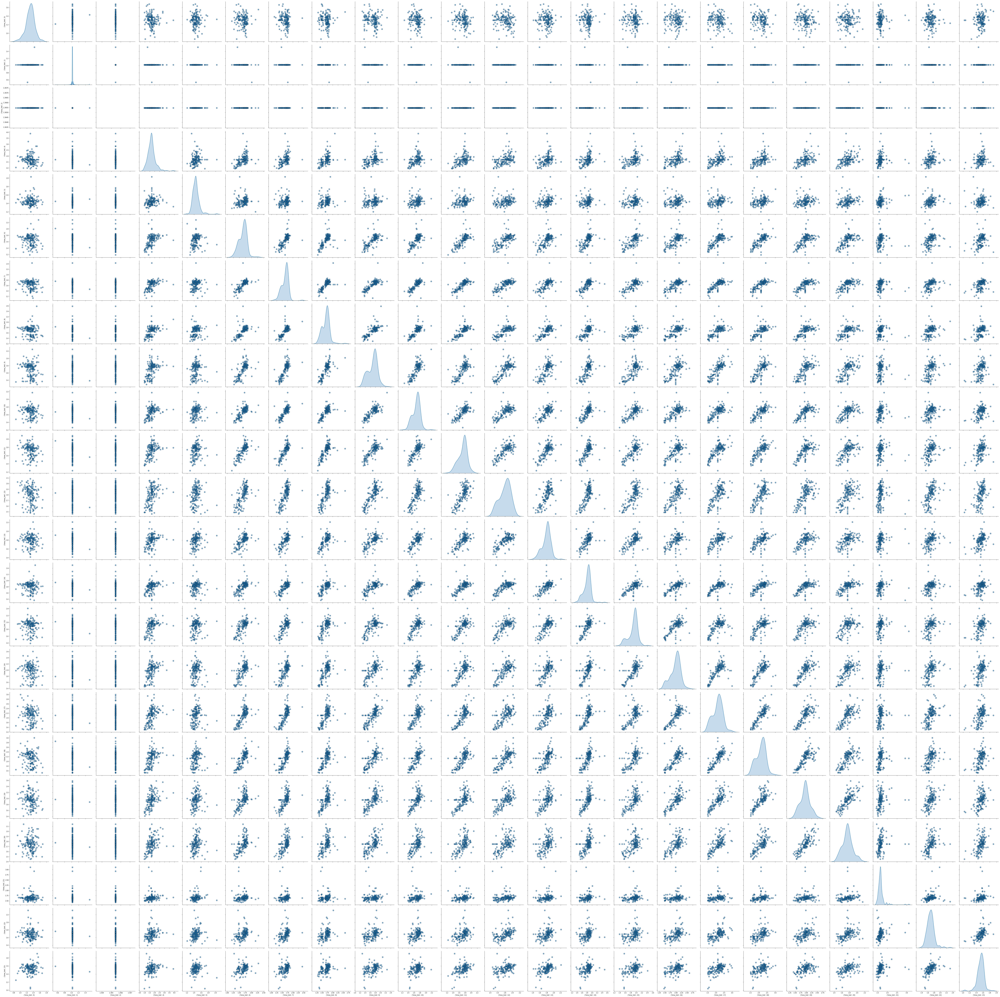

In [9]:
sns.pairplot(data_training.groupby(['day', 'day_hour'], as_index=True )['day', 'time_link'].mean()\
             .unstack().transform(lambda x: x.fillna(x.mean())), diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 4)

/home/marcos/.local/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


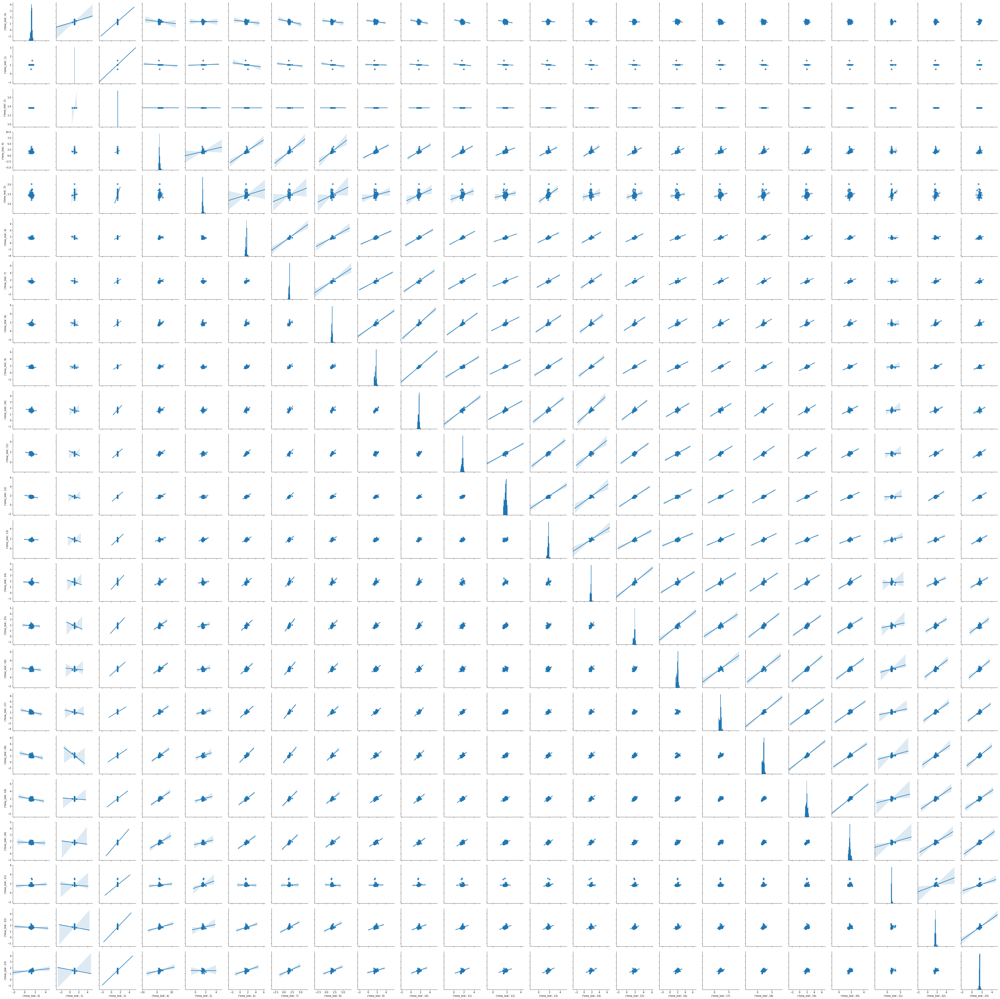

In [10]:
sns.pairplot(data_training.groupby(['day', 'day_hour'], as_index=True )['day', 'time_link'].mean()\
             .unstack().transform(lambda x: x.fillna(x.mean())), kind = 'reg')

/home/marcos/.local/lib/python3.6/site-packages/sklearn/mixture/base.py:237: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


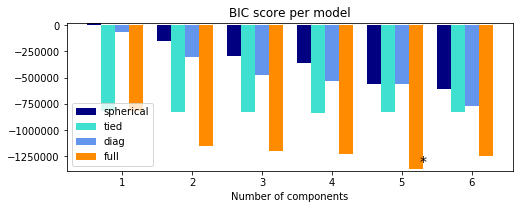

In [12]:
df_t=data_training
df_t['exact_time'] = pd.to_datetime(df_t['exact_time'])
df_t.index = df_t['exact_time']

X_Train = df_t.groupby([pd.Grouper(freq='20min'), 'link'], as_index=True ).mean()['time_link'].unstack()\
    .rolling(3).mean().transform(lambda x: x.fillna(x.mean())).reset_index().drop('exact_time', axis=1)


df_test=data_test
df_test['exact_time'] = pd.to_datetime(df_test['exact_time'])
df_test.index = df_test['exact_time']

X_Test = df_test.groupby([pd.Grouper(freq='20min'), 'link'], as_index=True ).mean()['time_link'].unstack()\
    .rolling(3).mean().transform(lambda x: x.fillna(x.mean())).reset_index().drop('exact_time', axis=1)

lowest_bic = np.infty
bic = []
n_components_range = range(1, 7)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(X_Train)
        bic.append(gmm.bic(X_Train))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(8, 6))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)


Number of samples Training: 9461
Converged: True


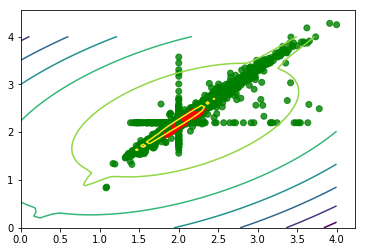

Number of samples Test: 5301


 ...]

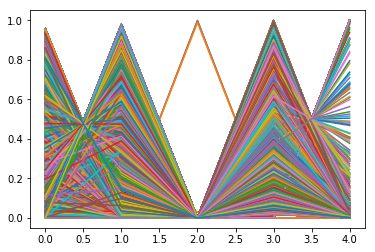

In [22]:
# data_training.groupby(['day', 'day_hour'], as_index=True )['day', 'time_link'].mean().unstack().transform(lambda x: x.fillna(x.mean()))
# gmm.fit(data_training.groupby(['day', 'day_hour'], as_index=True )['day', 'time_link'].mean().unstack().transform(lambda x: x.fillna(x.mean())))


link = 5

gmm = GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(X_Train[[link,link+1]])
print('Number of samples Training: ' + str(len(X_Train)))
print('Converged:',gmm.converged_) # Check if the model has converged

X, Y = np.meshgrid(np.linspace(0, 4), np.linspace(0,4))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)
Z = Z.reshape((50,50))

plt.contour(X, Y, Z)
colors = ['r' if i==0 else 'g' for i in gmm.predict(X_Train[[link,link + 1]])]
ax = plt.gca()
plt.scatter(X_Train[link],X_Train[link + 1], c=colors, alpha=0.8)
plt.show()

prediction = gmm.predict_proba(X_Test[[link,link + 1]])
print('Number of samples Test: ' + str(len(X_Test)))


plt.plot(prediction.T)

Converged: True
Number of samples Training: 9461
Number of samples Test: 5301


 ...]

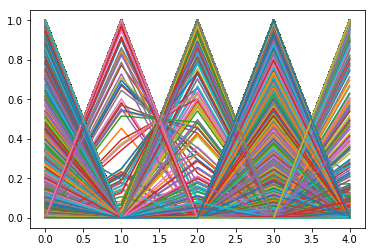

In [24]:
gmm = GaussianMixture(n_components=5, covariance_type='full')
gmm.fit(X_Train)
print('Converged:',gmm.converged_) # Check if the model has converged
print('Number of samples Training: ' + str(len(X_Train)))


print('Number of samples Test: ' + str(len(X_Test)))
prediction = gmm.predict_proba(X_Test)
plt.plot(prediction.T)

In [25]:
# -*- coding: utf-8 -*-
"""
Created on Thu Feb  2 15:04:12 2017
@author: Rob Romijnders
For explanation, see robromijnders.github.io/EM
"""

from scipy.stats import multivariate_normal
import numpy as np
import matplotlib.pyplot as plt
from util import plot_cov_ellipse,plot_EM
from scipy.stats import multivariate_normal as mvn


#generate the parameters (collectively named theta)
mu_gen = gmm.means_ 
sigma_gen = gmm.covariances_
# pi_gen = gmm.pi_gen

theta_gen = zip(mu_gen,sigma_gen)

mix_gen = [multivariate_normal(m,s) for m,s in theta_gen]

colors = ['r','b','m']

# Now generate data
N = len(X_Train)
X = X_Train

for m,s,_ in theta_gen:
  plot_cov_ellipse(s, m, ax=ax[0,0])
  
class fitGMM(plot_EM):
  def __init__(self,X,K = 2,max_iter = 5):
    self.K = K
    self.X = X
    self.max_iter = max_iter
    
    self.N, self.D = X.shape
    assert self.N > self.D
    
    #Random initialization
    self.phi = np.random.rand(K)
    self.phi /= np.sum(self.phi)
    
    #Randomly initialize means as existing samples
    self.mu = self.X[np.random.choice(self.N,self.K,replace=False)]  
#    self.mu = np.random.rand(self.K,self.D)*5.0-1.0
    self.sigma = np.zeros((self.K,self.D,self.D))
    for k in range(self.K):
      A = np.random.randn(self.D,self.D)
      self.sigma[k] = np.dot(A.T,A)
      assert np.all(np.linalg.eigvals(self.sigma[k]) > 0)
    
    self.expLL = np.zeros((max_iter,))
    
    self.Post = np.zeros((self.N,self.K))/self.K  #posteriors Bishop eq.9.13
    
    self.i = 0
    
    self.plot=False
    
    
  def fit(self):
    while self.i < self.max_iter:
      self.E_step()
      self.M_step()
      if (self.expLL[self.i] - self.expLL[self.i-1])**2 < 1E-1:
        if self.i>2:
          break
      print('Step %3.0f expLL %10.2f'%(self.i, self.expLL[self.i]))   
      self.i += 1
      
    self.theta = zip(list(self.mu),list(self.sigma),list(self.phi))
    return self.expLL
    
  def E_step(self):
    #Implements Bishop eq.9.23
    for n in range(self.N):
      for k in range(self.K):
        llike = mvn.logpdf(self.X[n],self.mu[k],self.sigma[k])
        #Update the expected log likelihood
        self.expLL[self.i] += self.Post[n,k]*llike
        #update the posterior
        self.Post[n,k] = self.phi[k]*np.exp(llike)
      
    #and normalize
    self.Post /= np.expand_dims(np.sum(self.Post,axis=1),1)
    return
    
    
  def M_step(self):
    Nk = np.sum(self.Post,axis=0) #Bishop eq.9.27
    self.mu = (np.dot(self.X.T,self.Post)/Nk).T #Calculates Bishop eq.9.24
    for k in range(self.K):  #Calculates Bishop eq.9.25
      Xm = self.X - self.mu[k]
      self.sigma[k] = 1/Nk[k]*np.dot(Xm.T*self.Post[:,k],Xm)
      assert np.all(np.linalg.eigvals(self.sigma[k]) > 0)
    self.phi = Nk/np.sum(Nk)  #Calculates Bishop eq.9.26
    return


In [26]:

fitgmm = fitGMM(np.array(X_Train[[link,link + 1]])) 
expLL = fitgmm.fit()

Step   0 expLL       0.00
Step   1 expLL   10176.82
Step   2 expLL   16595.98
Step   3 expLL   18894.89
Step   4 expLL   19256.62


In [27]:
fitgmm_ = fitGMM(np.array(pd.DataFrame(X_Train.stack()).reset_index().drop('level_0', axis=1))) 
expLL_ = fitgmm.fit()
